In [1]:
%matplotlib inline
import seaborn
import scipy, scipy.signal, IPython.display as ipd, matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (13, 4)

[&larr; Back to Index](index.html)

# Tuning Systems

1.  [Introduction](#Introduction)
1.  [Unison](#Unison)
1.  [Octaves](#Octaves)
1.  [Fifths](#Fifths)
1.  [Fourths](#Fourths)
1.  [Major Sixths](#Major-Sixths)
1.  [Minor Thirds](#Minor-Thirds)
1.  [Major Thirds](#Major-Thirds)
1.  [Minor Sixths](#Minor-Sixths)
1.  [Major Seconds](#Major-Seconds)
1.  [Minor Sevenths](#Minor-Sevenths)
1.  [Major Sevenths](#Major-Sevenths)
1.  [Minor Seconds](#Minor-Seconds)
1.  [Tritone, Augmented Fourths, Diminished Fifths](#Tritone,-Augmented-Fourths,-Diminished-Fifths)

## Introduction

### Tuning Systems

In twelve-tone **equal temperament**, all twelve semitones within the octave have the same width. With this tuning system, expressed as a frequency ratio, the interval of one semitone is $2^{1/12}$. Expressed in **cents**, this same interval is defined to be 100 cents. Therefore, the octave has 1200 cents.

In **just intonation**, the frequency ratio is expressed as a fraction between two small integers, e.g. 3:2, 4:3. As a result, the higher harmonic partials between two notes will overlap, resulting in a consonant interval that is pleasing to the ear. In **5-limit just tuning**, these fractions are expressed with prime factors no larger than 5, i.e. {2, 3, 5}. In **7-limit just tuning**, these fractions are expressed with prime factors no larger than 7, i.e. {2, 3, 5, 7}. For example, 7:4 is a 7-limit interval, but it is not a 5-limit interval.

In **Pythagorean tuning**, every frequency ratio is based upon the ratio 3:2. To find that ratio, from one note in the interval, step around the Circle of Fifths until you reach the other note in the interval, multiplying (if stepping forward) or dividing (if stepping backward) by 3/2 with each step. Finally, multiply or divide by 2 enough times to return to the octave of interest.

### How To Use This Notebook

In the examples below, listen to each interval, and compare intervals both visually and aurally across tuning systems. In some tuning systems, the upper harmonics do not align. In such cases, try to listen for dissonance and beat frequencies. Then compare them to the tuning systems where the harmonics align perfectly.

### Notebook Setup

Global parameters for this notebook:

In [2]:
T = 5.0     # duration in seconds
fs = 24000  # sampling rate in Hertz
fcutoff = 4000 # frequency cutoff for filter

Functions used to create the sounds and figures:

In [3]:
def simulate_tone(f0, harmonics=None):
    """Returns a tone with a specified fundamental frequency and harmonic amplitudes."""
    if harmonics is None:
        harmonics = [1]
    t = scipy.linspace(0, T, T*fs, endpoint=False)
    x = sum(v*scipy.sin(2*scipy.pi*i*f0*t) for i, v in enumerate(harmonics, 1))
    return x

In [4]:
def filter_tone(x, fcutoff=None):
    """Return a low-pass filtered signal."""
    if fcutoff is None:
        fcutoff = fs/2.0
    h = scipy.signal.firwin(55, 2*float(fcutoff)/fs)
    y = scipy.convolve(x, h)
    return y

In [5]:
def make_double_stop(ratio, f0=440, harmonics=None):
    """Listen to two tones played simultaneously, and plot the tones' spectra."""
    if harmonics is None:
        harmonics = [1]
    f1 = ratio*f0
    x0 = filter_tone(simulate_tone(f0, harmonics=harmonics), fcutoff=fcutoff)
    x1 = filter_tone(simulate_tone(f1, harmonics=harmonics), fcutoff=fcutoff)
    X0 = scipy.fft(x0)
    X1 = scipy.fft(x1)

    N = len(X0)
    f = scipy.linspace(0, fs, N, endpoint=False)
    
    plt.semilogy(f, abs(X0), marker='o', linewidth=1)
    plt.semilogy(f, abs(X1), color='r', linewidth=1)
    
    plt.xlim(xmax=(len(harmonics)+1)*(f1 if ratio > 1 else f0))
    plt.ylim(ymin=0.1)
    
    plt.xlabel('Frequency (Hz)')
    plt.legend(('f0 = %.2f Hz' % f0, 'f0 = %.2f Hz' % f1))
    
    print 'ratio:', ratio
    print 'cents:', scipy.log2(ratio)*1200
    return ipd.Audio(x0 + x1, rate=fs)

## Unison

*Within each section below, the intervals are provided in order of interval width from lowest to highest.*

ratio: 1
cents: 0.0


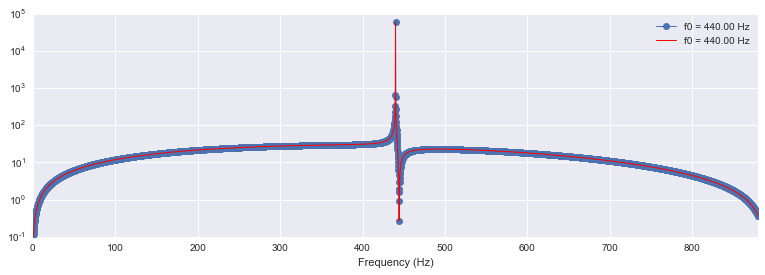

In [6]:
make_double_stop(1)

## Octaves

In [7]:
harmonics = [1.0, 0.5]

Just intonation or equal temperament, 12 semitones, 1200 cents:

ratio: 2
cents: 1200.0


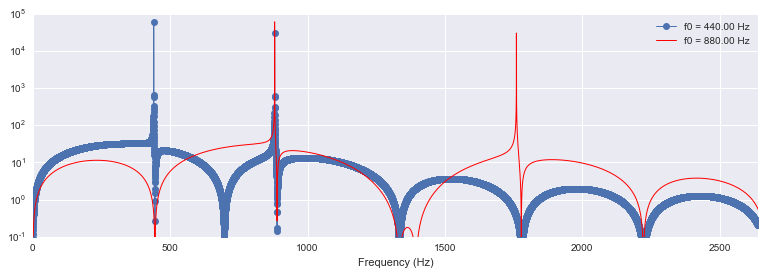

In [8]:
make_double_stop(2, harmonics=harmonics)

Pythagorean tuning, twelve steps forward on the Circle of Fifths. In Pythagorean tuning, multiply the fundamental frequency by 3/2 twelve times, and then divide by two enough times to return to the octave of interest:

$$ \left( \frac{3}{2} \right)^{12} \left( \frac{1}{2} \right)^6 = \frac{531441}{262144} \approx 2.0273 $$

ratio: 2.02728652954
cents: 1223.46001038


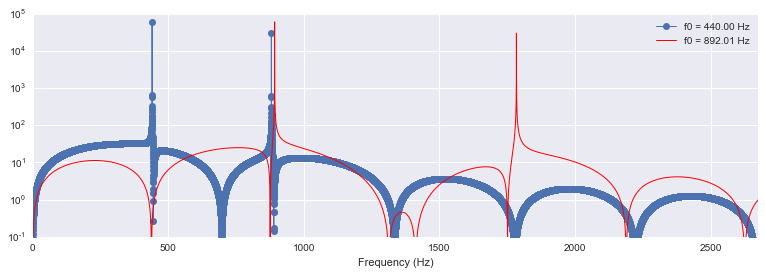

In [9]:
make_double_stop(531441.0/262144, harmonics=harmonics)

The *Pythagorean comma*, the degree of inconsistency when trying to define a twelve-tone scale using only perfect fifths, is about 1.0136 when expressed as a frequency ratio:

$$ \left( \frac{3}{2} \right)^{12} \left( \frac{1}{2} \right)^7 = \frac{531441}{524288} \approx 1.0136 $$

## Fifths

In [10]:
harmonics = [1.0, 0.1, 0.1]

Equal temperament, seven semitones, 700 cents:

ratio: 1.49830707688
cents: 700.0


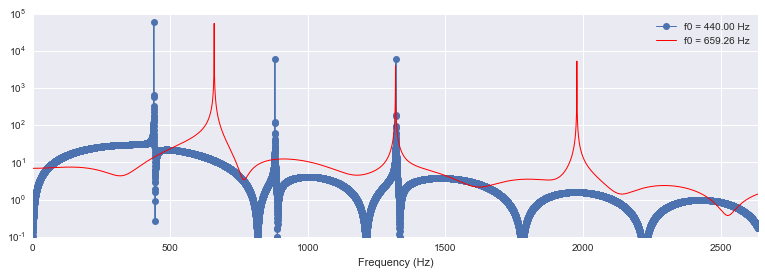

In [11]:
make_double_stop(2**(7.0/12), harmonics=harmonics)

Just intonation or Pythagorean tuning, one step forward on the Circle of Fifths:

ratio: 1.5
cents: 701.955000865


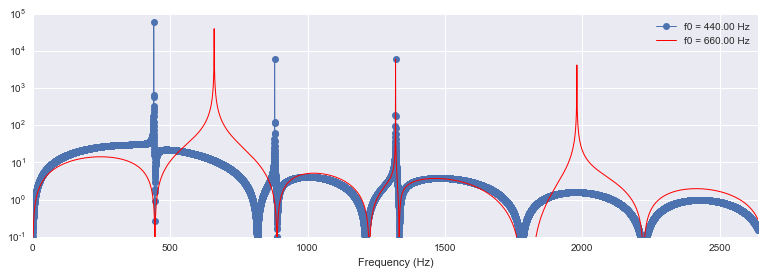

In [12]:
make_double_stop(3.0/2, harmonics=harmonics)

## Fourths

In [13]:
harmonics = [1.0, 0.01, 0.1, 0.1]

Just intonation or Pythagorean tuning, one step backward on the Circle of Fifths:

$$ \left( \frac{2}{3} \right) \left( \frac{2}{1} \right) = \frac{4}{3} = 1.\overline{3} $$

ratio: 1.33333333333
cents: 498.044999135


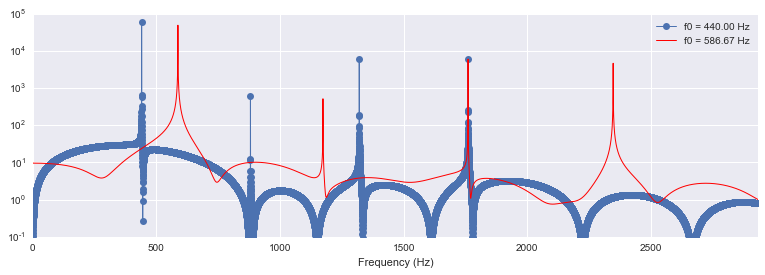

In [14]:
make_double_stop(4.0/3, harmonics=harmonics)

Equal temperament, five semitones:

ratio: 1.33483985417
cents: 500.0


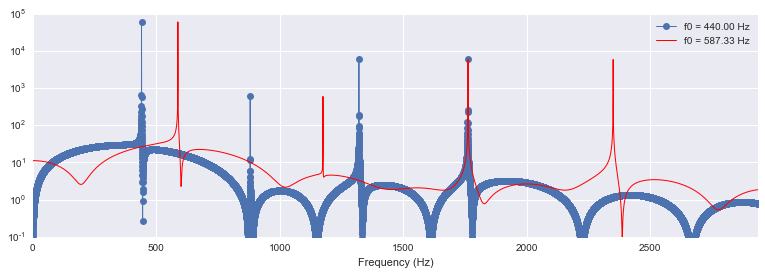

In [15]:
make_double_stop(2**(5.0/12), harmonics=harmonics)

## Major Sixths

In [16]:
harmonics = [1.0, 0.01, 0.1, 0.01, 0.1]

Just intonation:

ratio: 1.66666666667
cents: 884.358712999


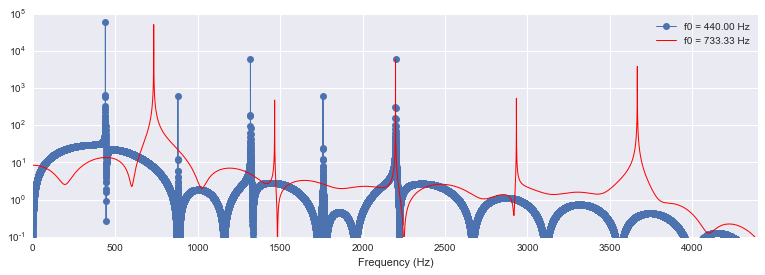

In [17]:
make_double_stop(5.0/3, harmonics=harmonics)

Equal temperament, i.e. nine semitones:

ratio: 1.68179283051
cents: 900.0


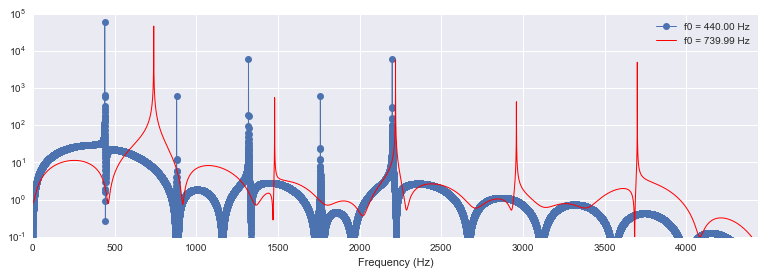

In [18]:
make_double_stop(2**(9.0/12), harmonics=harmonics)

Pythagorean tuning, three steps forward on the Circle of Fifths:

$$ \left( \frac{3}{2} \right)^3 \left( \frac{1}{2} \right) = \frac{27}{16} = 1.6875 $$

ratio: 1.6875
cents: 905.865002596


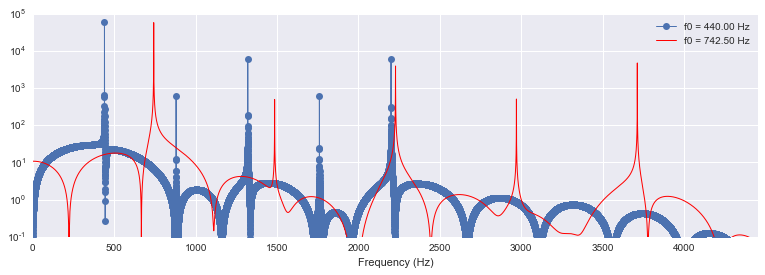

In [19]:
make_double_stop(27.0/16, harmonics=harmonics)

## Minor Thirds

In [20]:
harmonics = [1.0, 0.01, 0.01, 0.01, 0.1, 0.1]

Pythagorean tuning, three steps backward on the Circle of Fifths:

$$ \left( \frac{2}{3} \right)^3 \left( \frac{2}{1} \right)^2 = \frac{32}{27} = 1.\overline{185} $$

ratio: 1.18518518519
cents: 294.134997404


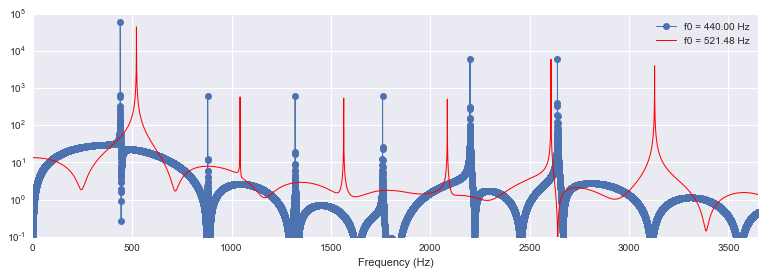

In [21]:
make_double_stop(32.0/27, harmonics=harmonics)

Equal temperament, three semitones:

ratio: 1.189207115
cents: 300.0


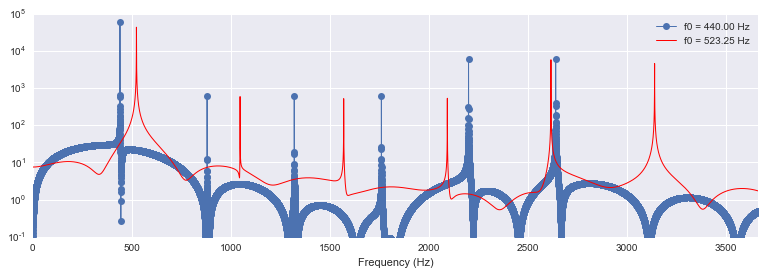

In [22]:
make_double_stop(2**(3.0/12), harmonics=harmonics)

Just intonation:

ratio: 1.2
cents: 315.641287001


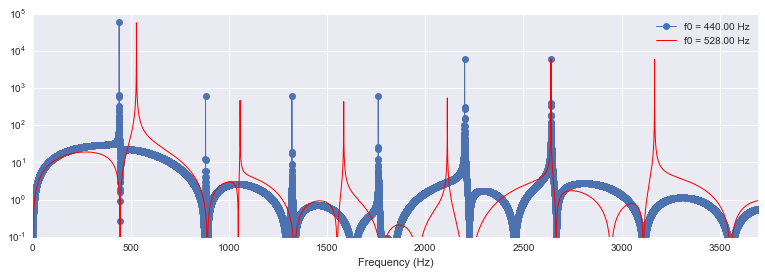

In [23]:
make_double_stop(6.0/5, harmonics=harmonics)

## Major Thirds

In [24]:
harmonics = [1.0, 0.01, 0.01, 0.1, 0.1]

Just intonation:

ratio: 1.25
cents: 386.313713865


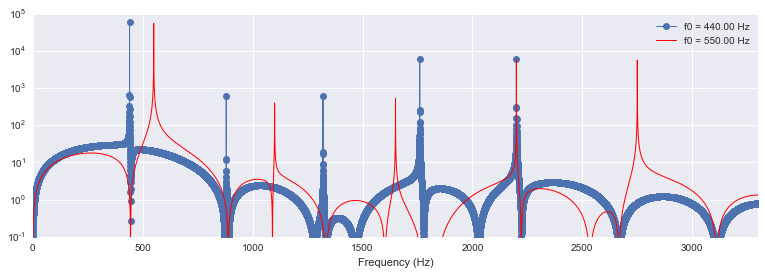

In [25]:
make_double_stop(5.0/4, harmonics=harmonics)

Equal temperament, four semitones:

ratio: 1.25992104989
cents: 400.0


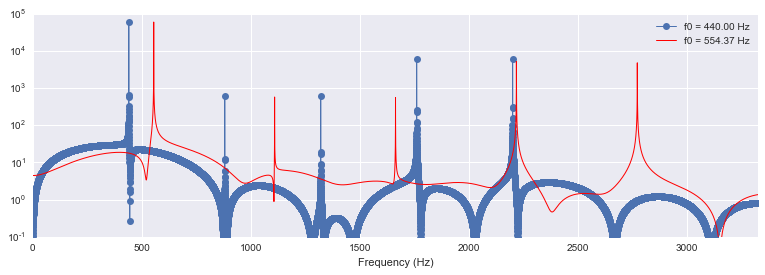

In [26]:
make_double_stop(2**(4.0/12), harmonics=harmonics)

Pythagorean tuning, four steps forward on the Circle of Fifths:

$$ \left( \frac{3}{2} \right)^4 \left( \frac{1}{2} \right)^2 = \frac{81}{64} = 1.265625 $$

ratio: 1.265625
cents: 407.820003462


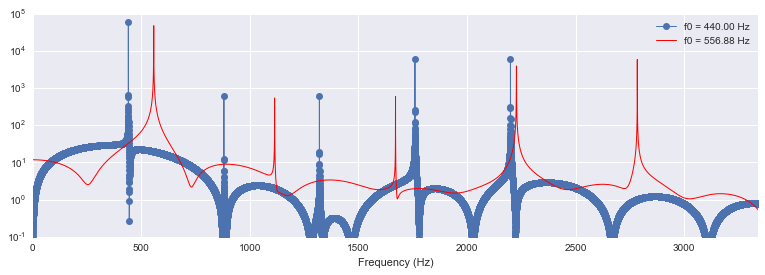

In [27]:
make_double_stop(81.0/64, harmonics=harmonics)

## Minor Sixths

In [28]:
harmonics = [1.0, 0.001, 0.001, 0.001, 0.01, 0.001, 0.001, 0.01]

Pythagorean tuning, four steps backward on the Circle of Fifths:

$$ \left( \frac{2}{3} \right)^4 \left( \frac{2}{1} \right)^3 = \frac{128}{81} \approx 1.58 $$

ratio: 1.58024691358
cents: 792.179996538


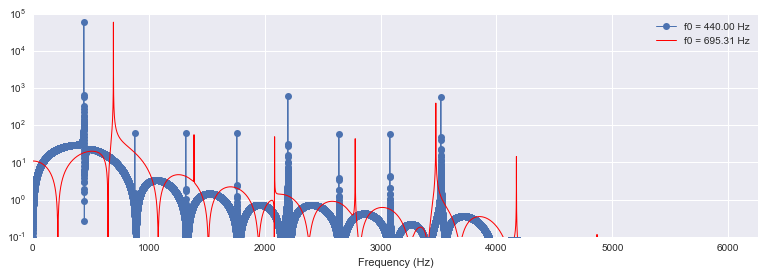

In [29]:
make_double_stop(128.0/81, harmonics=harmonics)

Equal temperament, eight semitones:

ratio: 1.58740105197
cents: 800.0


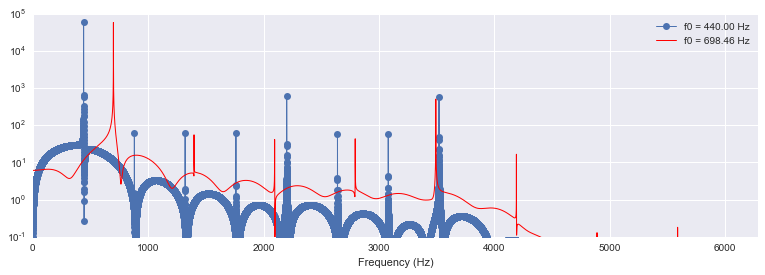

In [30]:
make_double_stop(2**(8.0/12), harmonics=harmonics)

Just intonation:

ratio: 1.6
cents: 813.686286135


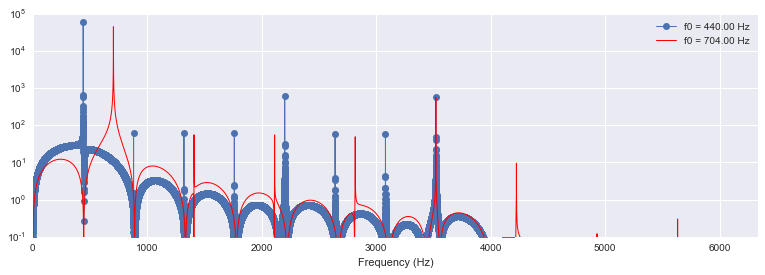

In [31]:
make_double_stop(8.0/5, harmonics=harmonics)

## Major Seconds

In [32]:
harmonics = [1.0, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.1, 0.1, 0.1]

In just intonation, there are two versions of the major second: the *major tone* a.k.a. *greater tone* (9:8), and the *minor tone* a.k.a. *lesser tone* (10:9). The difference between the two, expressed as a ratio of their widths, is called a *syntonic comma* and is equal to 81:80.

$$ \frac{10}{9} n = \frac{9}{8} \Rightarrow n = \frac{81}{80} $$

Just intonation (minor tone a.k.a. lesser tone). Observe how the tenth harmonic of the lower note aligns with the ninth harmonic of the upper note.

ratio: 1.11111111111
cents: 182.403712134


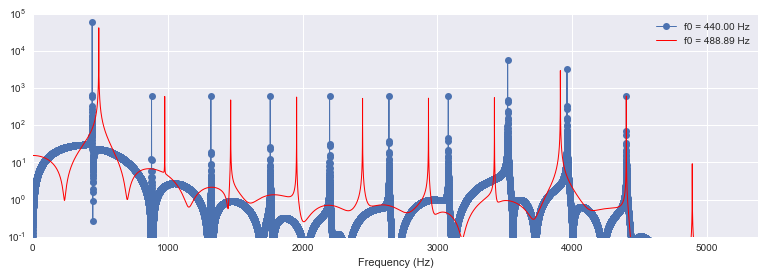

In [33]:
make_double_stop(10.0/9, harmonics=harmonics)

Equal temperament, two semitones:

ratio: 1.12246204831
cents: 200.0


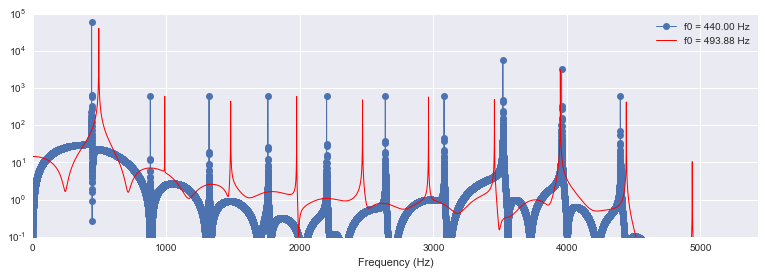

In [34]:
make_double_stop(2**(2.0/12), harmonics=harmonics)

Just intonation (major tone a.k.a. greater tone) or Pythagorean tuning, two steps forward on the Circle of Fifths:

$$ \left( \frac{3}{2} \right)^2 \left( \frac{1}{2} \right) = \frac{9}{8} = 1.125 $$

Observe how the ninth harmonic of the lower note aligns with the eighth harmonic of the upper note.

ratio: 1.125
cents: 203.910001731


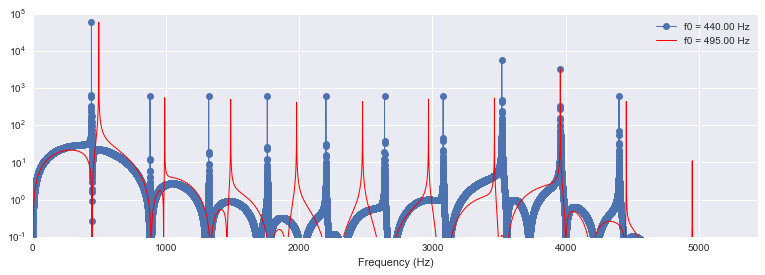

In [35]:
make_double_stop(9.0/8, harmonics=harmonics)

## Minor Sevenths

In [36]:
harmonics = [1.0, 0.01, 0.01, 0.1, 0.1, 0.01, 0.1, 0.01, 0.1]

7-limit just intonation, a.k.a. septimal minor seventh, harmonic seventh, or subminor seventh:

ratio: 1.75
cents: 968.825906469


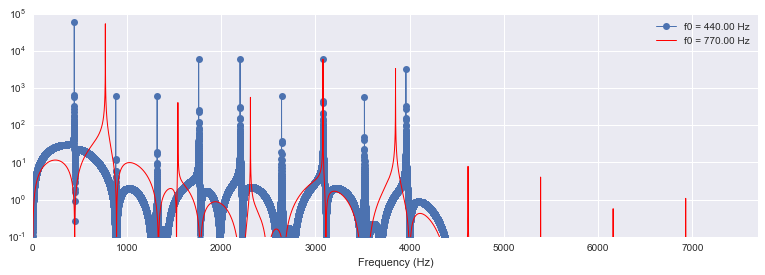

In [37]:
make_double_stop(7.0/4, harmonics=harmonics)

Pythagorean tuning, two steps backward on the Circle of Fifths, or small just minor seventh:

$$ \left( \frac{2}{3} \right)^2 \left( \frac{2}{1} \right)^2 = \frac{16}{9} = 1.\overline{7} $$

ratio: 1.77777777778
cents: 996.089998269


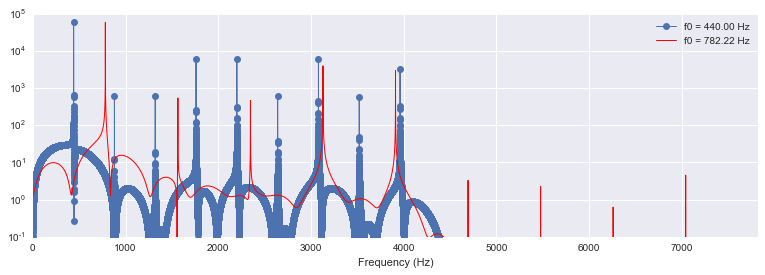

In [38]:
make_double_stop(16.0/9, harmonics=harmonics)

Equal temperament, ten semitones:

ratio: 1.78179743628
cents: 1000.0


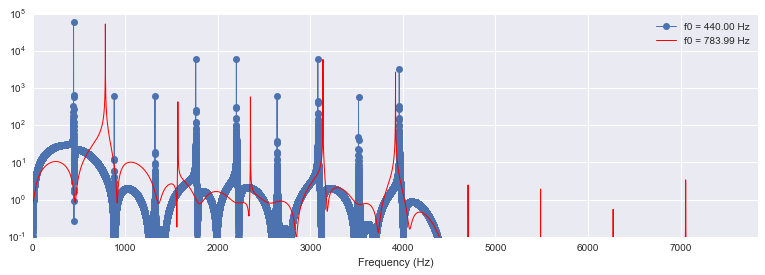

In [39]:
make_double_stop(2**(10.0/12), harmonics=harmonics)

5-limit just intonation, a.k.a. large just minor seventh:

ratio: 1.8
cents: 1017.59628787


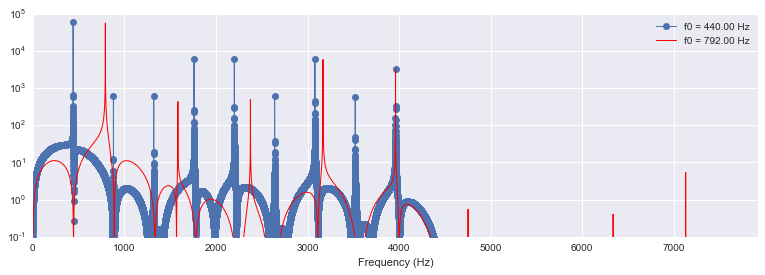

In [40]:
make_double_stop(9.0/5, harmonics=harmonics)

## Major Sevenths

In [41]:
harmonics = [1.0,] * 15

Just intonation:

ratio: 1.875
cents: 1088.26871473


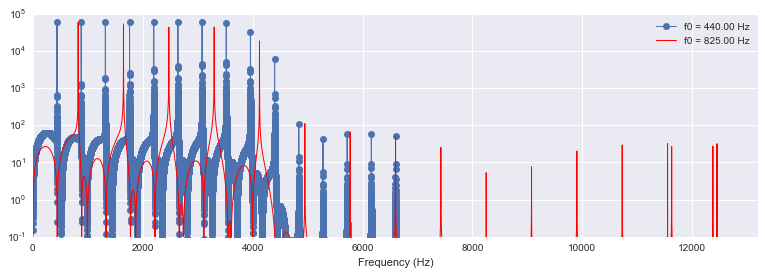

In [42]:
make_double_stop(15.0/8, harmonics=harmonics)

Equal temperament, eleven semitones:

ratio: 1.88774862536
cents: 1100.0


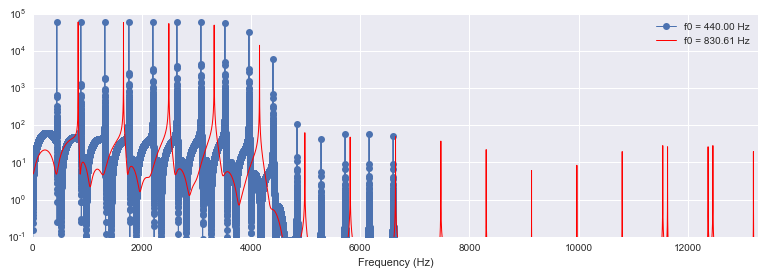

In [43]:
make_double_stop(2**(11.0/12), harmonics=harmonics)

Pythagorean tuning, five steps forward on the Circle of Fifths:

$$ \left( \frac{3}{2} \right)^5 \left( \frac{1}{2} \right)^2 = \frac{243}{128} \approx 1.8984 $$

ratio: 1.8984375
cents: 1109.77500433


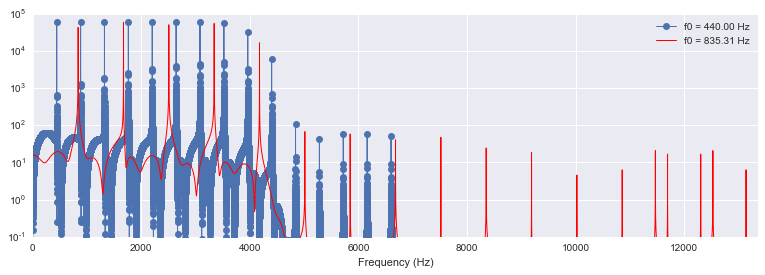

In [44]:
make_double_stop(243.0/128, harmonics=harmonics)

## Minor Seconds

In [45]:
harmonics = [0.01,] * 16
harmonics[0] = 1.0
harmonics[14] = 0.1
harmonics[15] = 0.1

Pythagorean tuning, five steps backward on the Circle of Fifths:

$$ \left( \frac{2}{3} \right)^5 \left( \frac{2}{1} \right)^3 = \frac{256}{243} \approx 1.0535 $$

ratio: 1.05349794239
cents: 90.2249956731


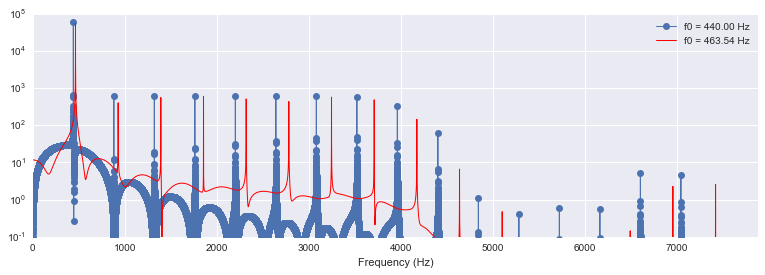

In [46]:
make_double_stop(256.0/243, harmonics=harmonics)

Equal temperament, one semitone:

ratio: 1.05946309436
cents: 100.0


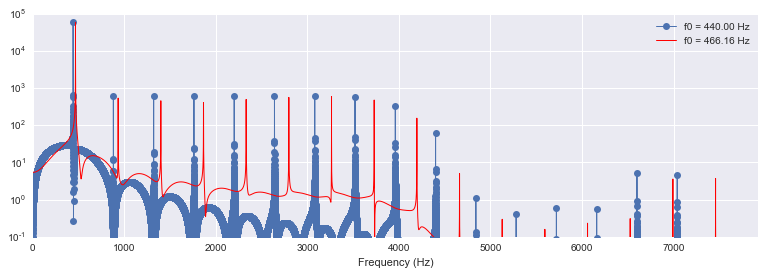

In [47]:
make_double_stop(2**(1.0/12), harmonics=harmonics)

Just intonation:

ratio: 1.06666666667
cents: 111.73128527


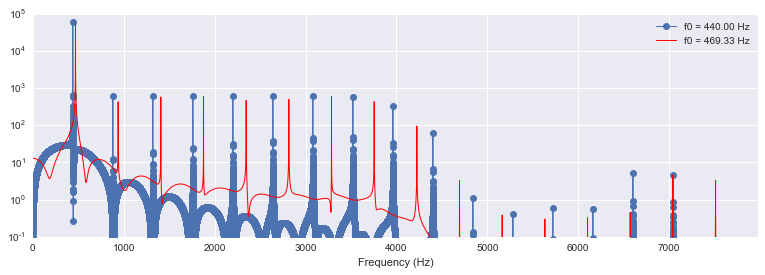

In [48]:
make_double_stop(16.0/15, harmonics=harmonics)

## Tritone, Augmented Fourths, Diminished Fifths

Diminished fifth, Pythagorean tuning, six steps backward on the Circle of Fifths:

$$ \left( \frac{2}{3} \right)^6 \left( \frac{2}{1} \right)^4 = \frac{1024}{729} \approx 1.40466 $$

ratio: 1.40466392318
cents: 588.269994808


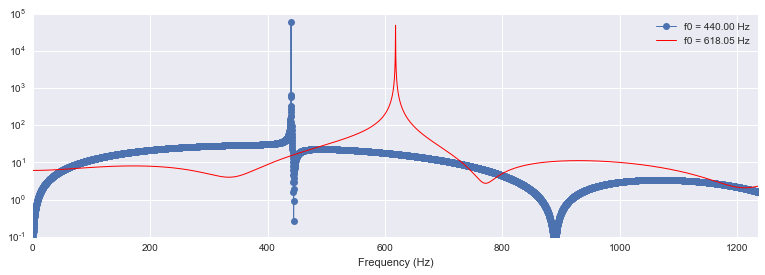

In [49]:
make_double_stop(1024.0/729)

Augmented fourth:

ratio: 1.40625
cents: 590.223715596


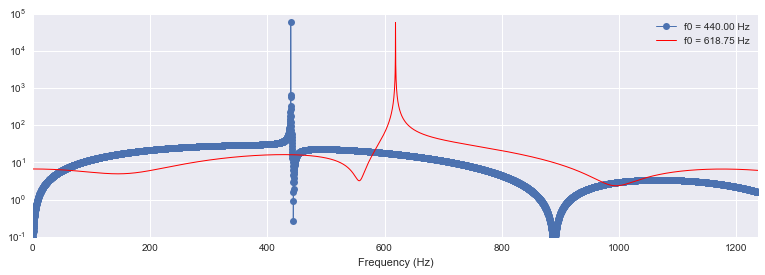

In [50]:
make_double_stop(45.0/32)

Equal temperament, six semitones, 600 cents:

ratio: 1.41421356237
cents: 600.0


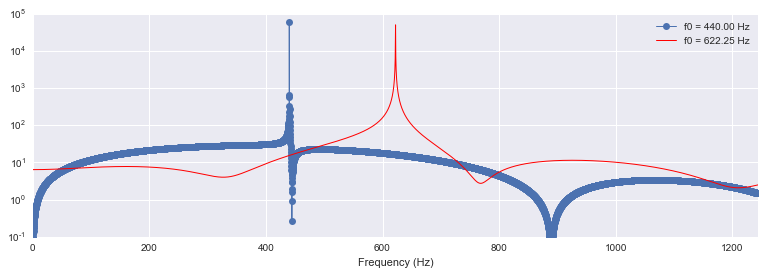

In [51]:
make_double_stop(2**(6.0/12))

Diminished fifth:

ratio: 1.42222222222
cents: 609.776284404


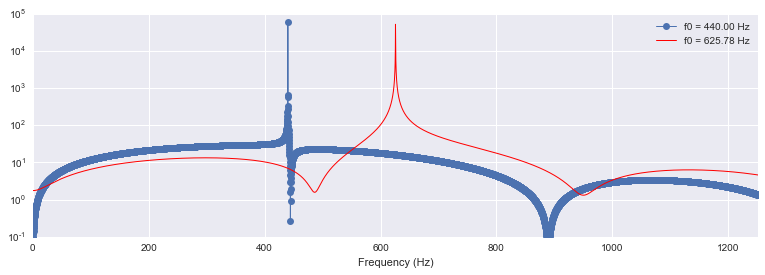

In [52]:
make_double_stop(64.0/45)

Augmented fourth, Pythagorean tuning, six steps forward on the Circle of Fifths:

$$ \left( \frac{3}{2} \right)^6 \left( \frac{1}{2} \right)^3 = \frac{729}{512} \approx 1.4238 $$

ratio: 1.423828125
cents: 611.730005192


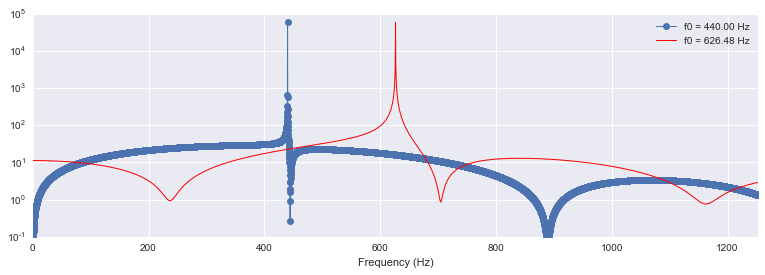

In [53]:
make_double_stop(729.0/512)

[&larr; Back to Index](index.html)